# **VENUE WISE ANALYSIS IN TRAIN, VALIDATION, AND TEST DATA**

* Using version B of released dataset (split by sensor)
* train = sensors 130, 133, 134, 136, 137 

  valid = sensors 132, 139
  
  test = sensors 140, 143, 146

In [269]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [270]:
sns.set_style('whitegrid')
plt.rcParams.update({'font.size': 12})

# **1. LOAD DATASET**

In [271]:
train_url = 'https://drive.google.com/uc?id=1r8xfRQIeA00sgt_CKU-WwsXBbjeZip2g'
val_url = 'https://drive.google.com/uc?id=1EkNEn3mok3CVrz8mwBpoxJGQPUReCJ2u'
test_url = 'https://drive.google.com/uc?id=1C5tjrnpq75skQy8-Q7xbXxOOJIVtkY_h'

In [272]:
train = pd.read_csv(train_url) 
val = pd.read_csv(val_url) 
test = pd.read_csv(test_url) 

In [273]:
train

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,137,2021-09-01 09:02:12.939383029+00:00,19.2,19.4,20.0,20.0,20.1,20.4,20.5,20.5,20.7,20.8,74,74,72,72,72,71,70,70,69,69,30291600,76400,1823600,69300,294100,252400,234800,69000,160600,200800,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,137,2021-09-01 09:02:49.563847064+00:00,19.6,19.7,20.2,20.2,20.3,20.6,20.6,20.6,20.8,20.9,69,70,70,70,69,69,69,69,68,68,102400000,144100,4785000,120800,577300,472900,416600,106100,196100,224900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,137,2021-09-01 09:03:26.179350+00:00,19.6,19.8,20.3,20.3,20.4,20.6,20.7,20.7,20.9,20.9,69,69,69,69,69,69,68,68,68,68,102400000,160600,5610900,133400,649900,532300,466800,115400,208000,238800,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,137,2021-09-01 09:04:02.821827+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.7,20.7,20.9,21.0,68,68,69,69,69,68,68,68,68,67,102400000,167900,6073700,139100,682400,560300,489200,119000,215000,245100,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,137,2021-09-01 09:04:39.888919115+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.8,20.8,21.0,21.0,68,68,69,68,69,68,68,68,68,67,102400000,156300,5593700,131700,645000,528200,465800,114900,214900,245500,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,130,2021-09-09 13:54:01.448236942+00:00,25.4,25.5,26.1,26.1,26.2,26.4,26.5,26.5,26.7,26.7,44,44,44,44,44,44,44,44,43,43,102400000,231900,6566700,178800,902700,677000,553000,141400,295900,349200,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1385,130,2021-09-09 13:54:38.105902910+00:00,25.5,25.6,26.1,26.2,26.3,26.5,26.6,26.6,26.8,26.8,44,44,44,44,44,44,43,43,43,43,102400000,251600,7474400,198600,1002900,745800,607700,151700,308500,362200,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1386,130,2021-09-09 13:55:14.770633935+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.9,43,43,44,43,44,43,43,43,43,43,102400000,264500,8161300,207000,1067200,786300,646200,157900,318900,378300,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1387,130,2021-09-09 13:55:51.865952014+00:00,25.6,25.7,26.3,26.3,26.4,26.6,26.6,26.6,26.8,26.9,43,43,43,43,43,43,43,43,43,43,102400000,259300,8076900,206000,1057300,780900,643800,157900,320100,381000,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


In [274]:
val

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,139,2021-09-01 08:58:37.190576076+00:00,18.9,19.0,19.6,19.6,19.7,20.0,20.1,20.0,20.2,20.3,75,75,73,73,73,72,71,71,70,70,102400000,153100,5097600,132800,661900,525300,461400,118300,250700,301900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,139,2021-09-01 08:59:13.819256067+00:00,19.2,19.3,19.8,19.8,19.9,20.1,20.2,20.2,20.4,20.4,70,70,70,70,70,70,69,69,69,69,102400000,228100,9009600,192600,1033200,811500,692800,160300,290400,331200,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,139,2021-09-01 08:59:50.441437959+00:00,19.3,19.4,19.9,19.9,20.0,20.2,20.3,20.3,20.4,20.5,69,69,69,69,69,69,69,69,69,68,102400000,252500,10590800,211700,1155700,916700,779500,174400,306000,345700,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,139,2021-09-01 09:00:27.082521915+00:00,19.3,19.5,20.0,20.0,20.0,20.3,20.3,20.3,20.5,20.5,69,69,69,69,69,69,69,68,68,68,102400000,261600,11303200,219400,1214300,972900,821800,180900,313600,354300,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,139,2021-09-01 09:01:04.330970+00:00,19.4,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,69,69,69,69,69,69,68,68,68,68,102400000,255400,11074000,218000,1204700,962600,814400,178600,313600,356100,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,132,2021-09-09 14:01:32.662157058+00:00,25.3,25.5,26.0,26.0,26.1,26.4,26.4,26.4,26.6,26.7,44,44,44,44,44,44,44,44,43,43,102400000,184200,6531300,150500,804800,615900,511600,121100,237300,274700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
454,132,2021-09-09 14:02:09.267132997+00:00,25.4,25.6,26.1,26.1,26.2,26.5,26.5,26.5,26.7,26.7,44,44,44,44,44,44,43,43,43,43,102400000,205200,7383500,162100,888100,680300,563100,130200,248700,284800,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
455,132,2021-09-09 14:02:46.403394937+00:00,25.5,25.6,26.2,26.2,26.3,26.5,26.6,26.5,26.7,26.8,43,43,43,43,43,43,43,43,43,43,102400000,202600,7255900,161200,880100,676300,564900,129700,253100,289100,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
456,132,2021-09-09 14:03:23.037255048+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.8,43,43,43,43,43,43,43,43,43,42,102400000,216800,8029400,172800,960600,731400,607100,137000,260800,295900,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


In [275]:
test

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,146,2021-09-01 09:01:36.817528009+00:00,18.8,19.0,19.6,19.6,19.7,20.0,20.1,20.1,20.3,20.4,74,74,72,72,72,71,70,70,69,69,102400000,198100,7285000,168200,855800,692100,613100,150400,300900,364900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,146,2021-09-01 09:02:13.375891+00:00,19.2,19.3,19.8,19.8,19.9,20.2,20.2,20.2,20.4,20.5,69,69,69,69,69,69,68,68,68,68,102400000,293900,13181000,254800,1375800,1115100,971500,216100,358000,416900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,146,2021-09-01 09:02:50.057426+00:00,19.3,19.4,19.9,19.9,20.0,20.3,20.3,20.3,20.5,20.5,68,68,68,68,68,68,68,68,67,67,102400000,329300,15918300,286200,1618300,1293700,1126200,241500,392200,440300,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,146,2021-09-01 09:03:26.565743+00:00,19.3,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,68,68,68,68,68,68,68,67,67,67,102400000,350300,17541700,300900,1726800,1395500,1204700,254200,408900,453400,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,146,2021-09-01 09:04:03.635421991+00:00,19.4,19.5,20.0,20.0,20.1,20.4,20.4,20.4,20.6,20.6,68,68,68,68,68,68,67,67,67,67,102400000,343900,17305500,296200,1697800,1378600,1195200,252000,408200,456800,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,140,2021-09-09 14:01:33.398730039+00:00,25.6,25.7,26.2,26.3,26.4,26.6,26.7,26.6,26.9,26.9,53,53,53,53,53,53,53,53,53,53,102400000,385600,16916800,339800,1901100,1480300,1217500,259800,355000,401700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
647,140,2021-09-09 14:02:10.090806961+00:00,25.7,25.9,26.3,26.4,26.4,26.7,26.7,26.7,26.9,27.0,53,53,53,53,53,53,53,53,53,53,102400000,377500,16557800,335800,1877600,1473900,1229600,261800,360600,414100,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
648,140,2021-09-09 14:02:46.800478935+00:00,25.8,25.9,26.4,26.4,26.5,26.7,26.8,26.8,27.0,27.0,53,53,53,53,53,53,53,53,53,53,102400000,388600,17374300,346000,1972500,1569000,1287600,270800,378700,427600,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
649,140,2021-09-09 14:03:23.476608991+00:00,25.8,25.9,26.4,26.5,26.6,26.8,26.8,26.8,27.0,27.1,53,53,53,53,53,53,53,53,53,53,102400000,402400,18476400,357600,2040300,1640600,1356700,280300,392400,439200,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


# **2. BASIC CHECKING AND FIX IT**

In [276]:
# data dimension

print(train.shape)
print(val.shape)
print(test.shape)

(1389, 44)
(458, 44)
(651, 44)


In [277]:
# data info

print(train.info(), '\n')
print(val.info(), '\n')
print(test.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1389 entries, 0 to 1388
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   sensor_node_id            1389 non-null   int64  
 1   scan_time                 1389 non-null   object 
 2   temp_0                    1389 non-null   float64
 3   temp_1                    1389 non-null   float64
 4   temp_2                    1389 non-null   float64
 5   temp_3                    1389 non-null   float64
 6   temp_4                    1389 non-null   float64
 7   temp_5                    1389 non-null   float64
 8   temp_6                    1389 non-null   float64
 9   temp_7                    1389 non-null   float64
 10  temp_8                    1389 non-null   float64
 11  temp_9                    1389 non-null   float64
 12  humid_0                   1389 non-null   int64  
 13  humid_1                   1389 non-null   int64  
 14  humid_2 

In [278]:
# correct data type

cols = ['scan_time', 'end_time', 'start_time','hotplate_start']

for col in cols:
  train[col] = pd.to_datetime(train[col])
  val[col] = pd.to_datetime(val[col])
  test[col] = pd.to_datetime(test[col])

In [279]:
# null value

print(train.isnull().sum(), '\n') # 244 rows have no burn_material_amount
print(val.isnull().sum(), '\n') # 103 rows have no burn_material_amount
print(test.isnull().sum(), '\n') # 81 rows have no burn_material_amount

sensor_node_id                0
scan_time                     0
temp_0                        0
temp_1                        0
temp_2                        0
temp_3                        0
temp_4                        0
temp_5                        0
temp_6                        0
temp_7                        0
temp_8                        0
temp_9                        0
humid_0                       0
humid_1                       0
humid_2                       0
humid_3                       0
humid_4                       0
humid_5                       0
humid_6                       0
humid_7                       0
humid_8                       0
humid_9                       0
gas_scan_0                    0
gas_scan_1                    0
gas_scan_2                    0
gas_scan_3                    0
gas_scan_4                    0
gas_scan_5                    0
gas_scan_6                    0
gas_scan_7                    0
gas_scan_8                    0
gas_scan

In [280]:
train[train['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    195
0     49
Name: encoded_specimen, dtype: int64

In [281]:
val[val['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    72
0    31
Name: encoded_specimen, dtype: int64

In [282]:
test[test['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    64
0    17
Name: encoded_specimen, dtype: int64

In [283]:
train[train['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    244
Name: trigger, dtype: int64

In [284]:
val[val['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    103
Name: trigger, dtype: int64

In [285]:
test[test['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    81
Name: trigger, dtype: int64

In [286]:
train[train['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    244
Name: burn_material, dtype: int64

In [287]:
val[val['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    103
Name: burn_material, dtype: int64

In [288]:
test[test['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    81
Name: burn_material, dtype: int64

In [289]:
train[train['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    244
Name: venue, dtype: int64

In [290]:
val[val['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    103
Name: venue, dtype: int64

In [291]:
test[test['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    81
Name: venue, dtype: int64

All null values in burn_material_amount (g):
* From hall venue
* With Scott Pine branches in fire bowl material
* With manual trigger

# **3. FURTHER**

# **3.1. CHECK VENUE DISTRIBUTION**

3.1.1. VENUE DISTRIBUTION IN TRAIN DATA

In [292]:
train['venue'].value_counts()

hall       994
chamber    395
Name: venue, dtype: int64

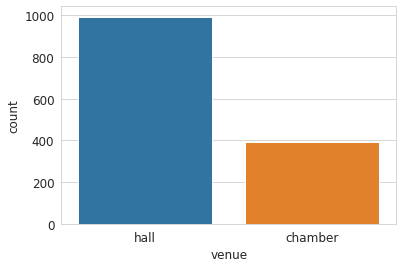

In [293]:
sns.countplot(data=train, x='venue')

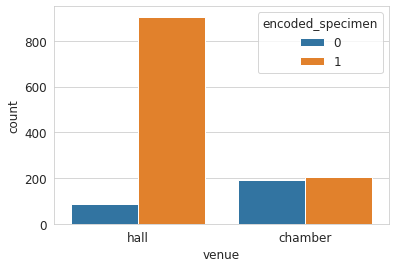

In [294]:
sns.countplot(data=train, x='venue', hue='encoded_specimen') # most of in_smoke class cases were predicted in hall environment

3.1.2. VENUE DISTRIBUTION IN VALIDATION DATA

In [295]:
val['venue'].value_counts()

hall       320
chamber    138
Name: venue, dtype: int64

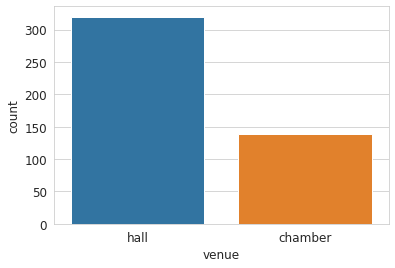

In [296]:
sns.countplot(data=val, x='venue')

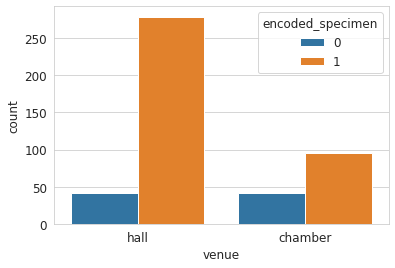

In [297]:
sns.countplot(data=val, x='venue', hue='encoded_specimen')

3.1.3. VENUE DISTRIBUTION IN TEST DATA

In [298]:
test['venue'].value_counts()

hall       477
chamber    174
Name: venue, dtype: int64

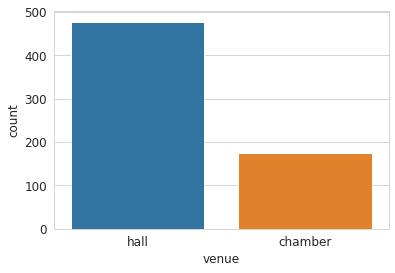

In [299]:
sns.countplot(data=test, x='venue')

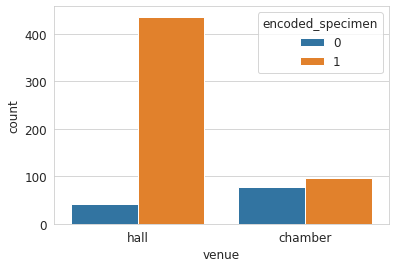

In [300]:
sns.countplot(data=test, x='venue', hue='encoded_specimen')

# **3.2. TRAIN DATA VENUE WISE ANALYSIS**

In [301]:
def plot_temperature_distributions(df_hall, df_chamber):
  temp = ['temp_0', 'temp_1', 'temp_2', 'temp_3','temp_4', 'temp_5', 'temp_6', 'temp_7', 'temp_8', 'temp_9']

  fig, ax = plt.subplots(10, 2, figsize=(50,150))

  for i in range(len(temp)):
    sns.distplot(ax=ax[i][0], x=df_hall[temp[i]])
    ax[i][0].set_title('Hall: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=df_chamber[temp[i]])
    ax[i][1].set_title('Chamber: '+ temp[i], fontsize=25)

In [302]:
def plot_humidity_distributions(df_hall, df_chamber):
  humid = ['humid_0','humid_1','humid_2','humid_3','humid_4','humid_5','humid_6','humid_7','humid_8','humid_9']

  fig, ax = plt.subplots(10, 2, figsize=(50,150))

  for i in range(len(humid)):
    sns.distplot(ax=ax[i][0], x=df_hall[humid[i]])
    ax[i][0].set_title('Hall: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=df_chamber[humid[i]])
    ax[i][1].set_title('Chamber: '+ humid[i], fontsize=25)

In [303]:
def plot_gas_scan_distributions(df_hall, df_chamber):
  gas_scan = ['gas_scan_0', 'gas_scan_1', 'gas_scan_2', 'gas_scan_3', 'gas_scan_4', 'gas_scan_5', 'gas_scan_6', 'gas_scan_7', 'gas_scan_8', 'gas_scan_9']

  fig, ax = plt.subplots(10, 2, figsize=(50,150))

  for i in range(len(gas_scan)):
    sns.distplot(ax=ax[i][0], x=df_hall[gas_scan[i]])
    ax[i][0].set_title('Hall: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=df_chamber[gas_scan[i]])
    ax[i][1].set_title('Chamber: '+ gas_scan[i], fontsize=25)

3.2.1. READ DATA

In [304]:
train_hall = train[train['venue']=='hall'] 
train_chamber = train[train['venue']=='chamber'] 

In [305]:
train_hall

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,137,2021-09-01 09:02:12.939383029+00:00,19.2,19.4,20.0,20.0,20.1,20.4,20.5,20.5,20.7,20.8,74,74,72,72,72,71,70,70,69,69,30291600,76400,1823600,69300,294100,252400,234800,69000,160600,200800,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,137,2021-09-01 09:02:49.563847064+00:00,19.6,19.7,20.2,20.2,20.3,20.6,20.6,20.6,20.8,20.9,69,70,70,70,69,69,69,69,68,68,102400000,144100,4785000,120800,577300,472900,416600,106100,196100,224900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,137,2021-09-01 09:03:26.179350+00:00,19.6,19.8,20.3,20.3,20.4,20.6,20.7,20.7,20.9,20.9,69,69,69,69,69,69,68,68,68,68,102400000,160600,5610900,133400,649900,532300,466800,115400,208000,238800,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,137,2021-09-01 09:04:02.821827+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.7,20.7,20.9,21.0,68,68,69,69,69,68,68,68,68,67,102400000,167900,6073700,139100,682400,560300,489200,119000,215000,245100,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,137,2021-09-01 09:04:39.888919115+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.8,20.8,21.0,21.0,68,68,69,68,69,68,68,68,68,67,102400000,156300,5593700,131700,645000,528200,465800,114900,214900,245500,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1036,130,2021-09-06 12:10:20.084362983+00:00,21.7,21.9,22.4,22.4,22.5,22.7,22.8,22.8,23.0,23.0,61,61,61,61,61,61,60,60,60,59,3939400,29300,239600,25100,74700,50300,40200,19300,44300,54000,2,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
1037,130,2021-09-06 12:10:56.596872091+00:00,21.8,22.0,22.5,22.5,22.6,22.8,22.9,22.9,23.1,23.1,60,60,60,60,60,59,59,59,59,59,6382500,36300,330000,30500,96300,60700,45100,21400,42100,46300,3,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
1038,130,2021-09-06 12:11:33.233149051+00:00,21.9,22.0,22.5,22.6,22.6,22.9,22.9,22.9,23.1,23.2,60,60,60,60,60,60,59,59,59,59,4853000,32800,282200,28100,86100,58300,45400,21600,48100,51000,4,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
1039,130,2021-09-06 12:12:09.926887035+00:00,21.9,22.1,22.6,22.6,22.7,22.9,23.0,23.0,23.2,23.2,60,60,60,60,60,60,59,59,59,59,5537000,34400,293600,29000,89200,58000,44800,21500,46500,50200,5,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall


In [306]:
train_chamber

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
510,136,2021-09-02 12:03:46.723665952+00:00,22.7,22.8,23.5,23.5,23.6,23.8,23.9,23.9,24.1,24.2,62,62,60,60,60,59,58,58,58,57,1144100,18200,207700,20500,64800,68900,74500,29000,120300,166900,1,0,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
511,136,2021-09-02 12:04:23.351389884+00:00,23.0,23.2,23.7,23.7,23.8,24.0,24.1,24.1,24.3,24.3,58,58,58,58,58,57,57,57,57,56,67719904,110600,2511300,89100,395400,304100,265900,81000,175500,208800,2,0,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
512,136,2021-09-02 12:04:59.785482883+00:00,23.1,23.3,23.8,23.8,23.9,24.1,24.1,24.1,24.4,24.4,57,57,57,57,57,57,56,56,56,56,99372200,131200,3347700,105200,481600,361800,311300,91100,198000,224600,3,0,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
513,136,2021-09-02 12:05:36.511864900+00:00,23.2,23.3,23.8,23.8,23.9,24.2,24.2,24.2,24.4,24.5,57,57,57,57,57,56,56,56,56,56,102400000,139500,3681700,111300,509700,393800,330000,96600,205300,232600,4,0,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
514,136,2021-09-02 12:06:13.581692934+00:00,23.2,23.4,23.9,23.9,24.0,24.2,24.3,24.2,24.4,24.5,56,56,56,57,57,56,56,56,56,55,100515296,131900,3468900,106900,485700,378700,316500,94300,204800,234500,5,0,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,130,2021-09-09 13:54:01.448236942+00:00,25.4,25.5,26.1,26.1,26.2,26.4,26.5,26.5,26.7,26.7,44,44,44,44,44,44,44,44,43,43,102400000,231900,6566700,178800,902700,677000,553000,141400,295900,349200,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1385,130,2021-09-09 13:54:38.105902910+00:00,25.5,25.6,26.1,26.2,26.3,26.5,26.6,26.6,26.8,26.8,44,44,44,44,44,44,43,43,43,43,102400000,251600,7474400,198600,1002900,745800,607700,151700,308500,362200,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1386,130,2021-09-09 13:55:14.770633935+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.9,43,43,44,43,44,43,43,43,43,43,102400000,264500,8161300,207000,1067200,786300,646200,157900,318900,378300,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1387,130,2021-09-09 13:55:51.865952014+00:00,25.6,25.7,26.3,26.3,26.4,26.6,26.6,26.6,26.8,26.9,43,43,43,43,43,43,43,43,43,43,102400000,259300,8076900,206000,1057300,780900,643800,157900,320100,381000,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


3.2.2. CORRELATION

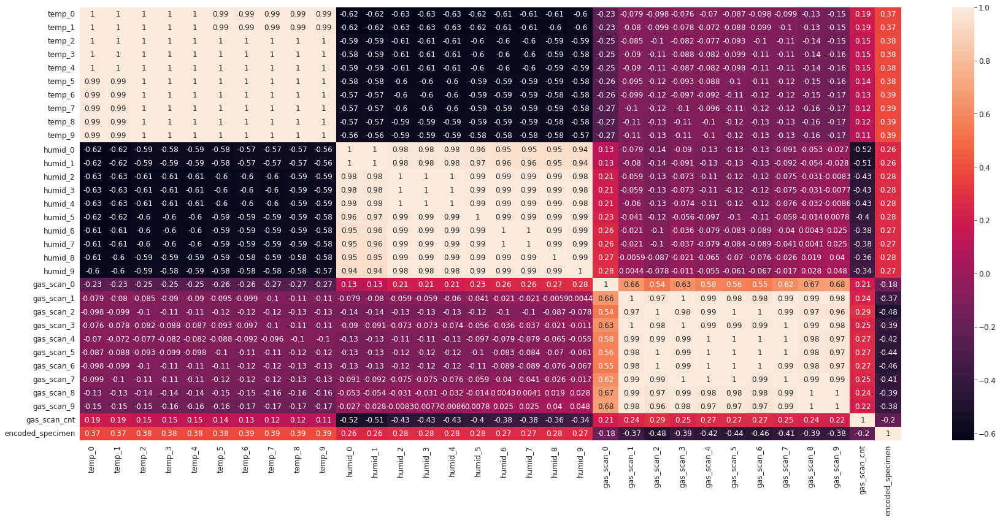

In [307]:
# correlation: hall

columns_included = ['temp_0', 'temp_1', 'temp_2', 'temp_3',
                    'temp_4', 'temp_5', 'temp_6', 'temp_7', 'temp_8', 'temp_9', 'humid_0',
                    'humid_1', 'humid_2', 'humid_3', 'humid_4', 'humid_5', 'humid_6',
                    'humid_7', 'humid_8', 'humid_9', 'gas_scan_0', 'gas_scan_1',
                    'gas_scan_2', 'gas_scan_3', 'gas_scan_4', 'gas_scan_5', 'gas_scan_6',
                    'gas_scan_7', 'gas_scan_8', 'gas_scan_9', 'gas_scan_cnt',
                    'encoded_specimen']

plt.figure(figsize=(30,13))
sns.heatmap(train_hall[columns_included].corr(), annot=True)

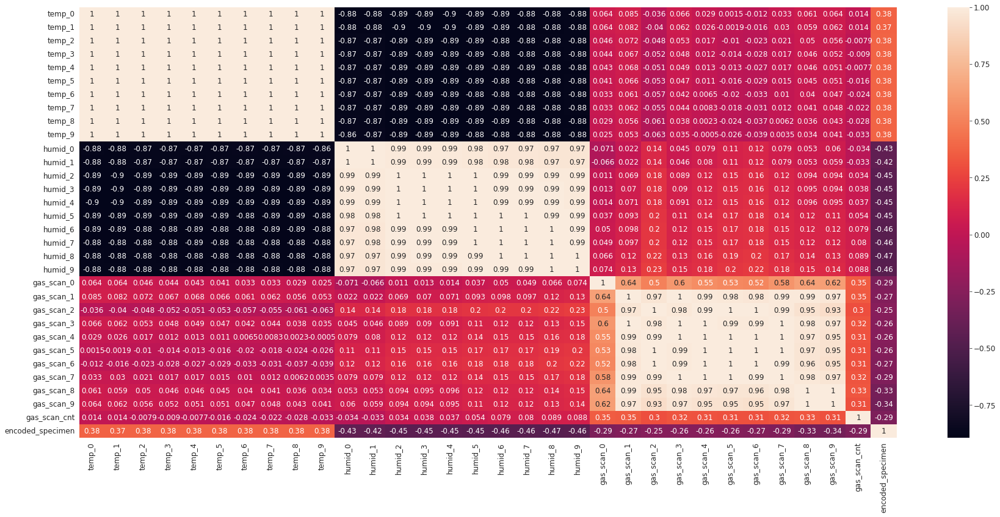

In [308]:
# correlation: chamber

plt.figure(figsize=(30,13))
sns.heatmap(train_chamber[columns_included].corr(), annot=True)

3.2.3. TEMPERATURE DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

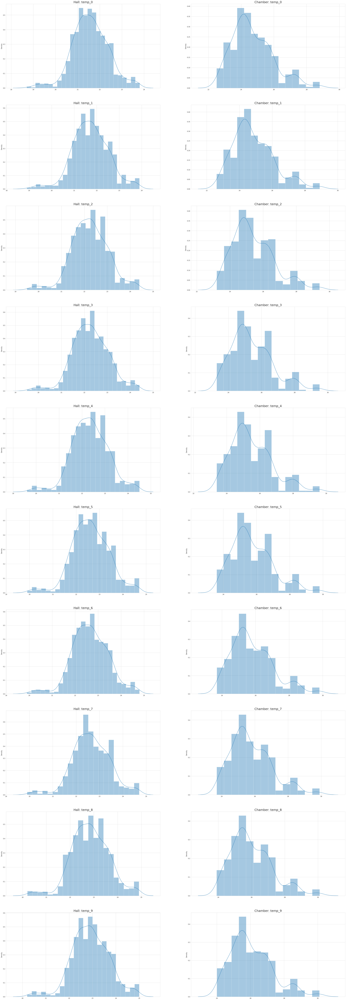

In [309]:
plot_temperature_distributions(train_hall, train_chamber)

3.2.4. HUMIDITY DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

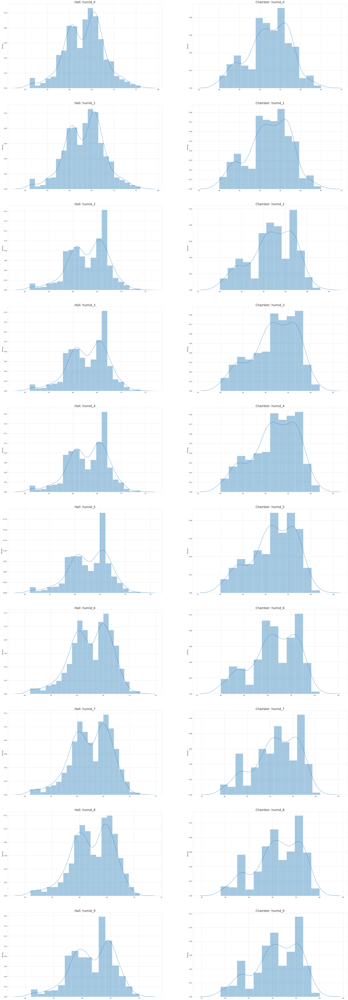

In [310]:
plot_humidity_distributions(train_hall, train_chamber)

3.2.5. GAS SCAN DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

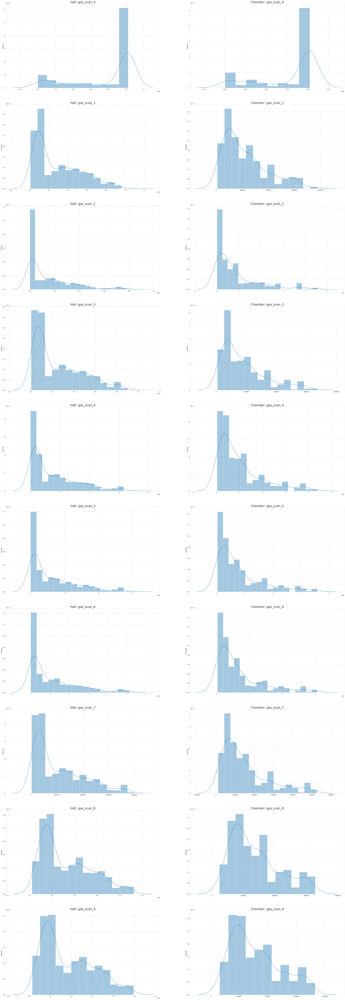

In [311]:
plot_gas_scan_distributions(train_hall, train_chamber)

# **3.3. VALIDATION DATA VENUE WISE ANALYSIS**

3.3.1. READ DATA

In [312]:
val_hall = val[val['venue']=='hall'] 
val_chamber = val[val['venue']=='chamber'] 

In [313]:
val_hall

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,139,2021-09-01 08:58:37.190576076+00:00,18.9,19.0,19.6,19.6,19.7,20.0,20.1,20.0,20.2,20.3,75,75,73,73,73,72,71,71,70,70,102400000,153100,5097600,132800,661900,525300,461400,118300,250700,301900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,139,2021-09-01 08:59:13.819256067+00:00,19.2,19.3,19.8,19.8,19.9,20.1,20.2,20.2,20.4,20.4,70,70,70,70,70,70,69,69,69,69,102400000,228100,9009600,192600,1033200,811500,692800,160300,290400,331200,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,139,2021-09-01 08:59:50.441437959+00:00,19.3,19.4,19.9,19.9,20.0,20.2,20.3,20.3,20.4,20.5,69,69,69,69,69,69,69,69,69,68,102400000,252500,10590800,211700,1155700,916700,779500,174400,306000,345700,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,139,2021-09-01 09:00:27.082521915+00:00,19.3,19.5,20.0,20.0,20.0,20.3,20.3,20.3,20.5,20.5,69,69,69,69,69,69,69,68,68,68,102400000,261600,11303200,219400,1214300,972900,821800,180900,313600,354300,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,139,2021-09-01 09:01:04.330970+00:00,19.4,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,69,69,69,69,69,69,68,68,68,68,102400000,255400,11074000,218000,1204700,962600,814400,178600,313600,356100,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,132,2021-09-06 11:59:35.056008100+00:00,21.7,21.9,22.4,22.4,22.5,22.7,22.8,22.7,22.9,23.0,58,58,58,58,58,58,57,57,57,57,10045300,36600,399100,29500,100000,60200,44300,20400,45800,52700,2,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
328,132,2021-09-06 12:00:11.587368011+00:00,21.8,22.0,22.5,22.5,22.6,22.8,22.8,22.8,23.0,23.1,57,57,57,57,57,57,57,57,57,57,8625400,34500,342500,27800,90300,54800,40900,19600,46400,55600,3,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
329,132,2021-09-06 12:00:48.135590076+00:00,21.9,22.0,22.5,22.5,22.6,22.9,22.9,22.9,23.1,23.1,57,57,57,57,57,57,56,56,56,56,9462300,36600,415600,30900,106100,69600,54500,24000,59500,69000,4,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
330,132,2021-09-06 12:01:25.092179059+00:00,21.9,22.1,22.6,22.6,22.7,22.9,22.9,22.9,23.1,23.2,56,56,57,57,57,56,56,56,56,56,12661500,42900,501400,33600,118900,70500,52400,23600,53900,60900,5,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall


In [314]:
val_chamber

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
170,139,2021-09-02 12:47:25.257577896+00:00,22.5,22.6,23.3,23.3,23.4,23.7,23.8,23.7,23.9,24.0,65,65,62,62,62,61,61,61,60,60,3509100,31800,481300,34700,129800,120800,118700,42200,150800,211300,1,1,automatic,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
171,139,2021-09-02 12:48:38.860054969+00:00,22.9,23.1,23.6,23.6,23.7,23.9,24.0,24.0,24.1,24.2,59,59,59,59,59,59,59,59,58,58,102400000,184600,5622500,150100,766000,576900,481300,126900,243400,273800,2,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
172,139,2021-09-02 12:49:15.532773971+00:00,23.0,23.1,23.7,23.7,23.8,24.0,24.0,24.0,24.2,24.2,59,59,59,59,59,59,58,58,58,58,102400000,201300,6301500,160600,826800,624900,521700,133500,253700,287200,3,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
173,139,2021-09-02 12:49:52.854196071+00:00,23.0,23.2,23.7,23.7,23.8,24.0,24.1,24.0,24.2,24.3,59,59,59,59,59,58,58,58,58,58,102400000,195500,6148900,156500,810100,612600,510000,130800,253900,289900,4,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
174,139,2021-09-02 12:50:29.533062934+00:00,23.1,23.2,23.7,23.7,23.8,24.0,24.1,24.1,24.3,24.3,58,58,58,58,58,58,58,58,58,58,102400000,212200,6863800,166900,886900,661900,553000,138900,261000,296700,5,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,132,2021-09-09 14:01:32.662157058+00:00,25.3,25.5,26.0,26.0,26.1,26.4,26.4,26.4,26.6,26.7,44,44,44,44,44,44,44,44,43,43,102400000,184200,6531300,150500,804800,615900,511600,121100,237300,274700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
454,132,2021-09-09 14:02:09.267132997+00:00,25.4,25.6,26.1,26.1,26.2,26.5,26.5,26.5,26.7,26.7,44,44,44,44,44,44,43,43,43,43,102400000,205200,7383500,162100,888100,680300,563100,130200,248700,284800,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
455,132,2021-09-09 14:02:46.403394937+00:00,25.5,25.6,26.2,26.2,26.3,26.5,26.6,26.5,26.7,26.8,43,43,43,43,43,43,43,43,43,43,102400000,202600,7255900,161200,880100,676300,564900,129700,253100,289100,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
456,132,2021-09-09 14:03:23.037255048+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.8,43,43,43,43,43,43,43,43,43,42,102400000,216800,8029400,172800,960600,731400,607100,137000,260800,295900,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


3.3.2. CORRELATION

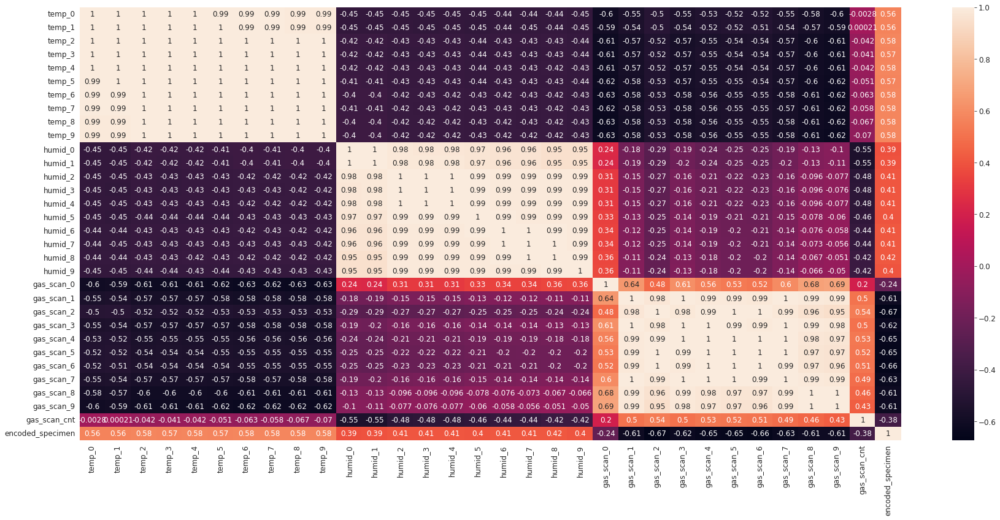

In [315]:
# Correlation: Hall

plt.figure(figsize=(30,13))
sns.heatmap(val_hall[columns_included].corr(), annot=True)

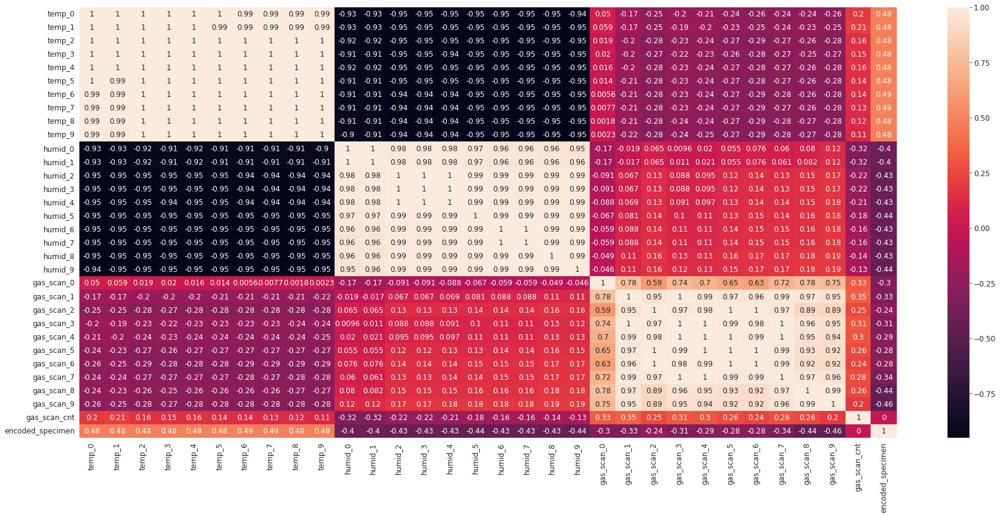

In [316]:
# Correlation : Chamber

plt.figure(figsize=(30,13))
sns.heatmap(val_chamber[columns_included].corr(), annot=True)

3.3.3. TEMPERATURE DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

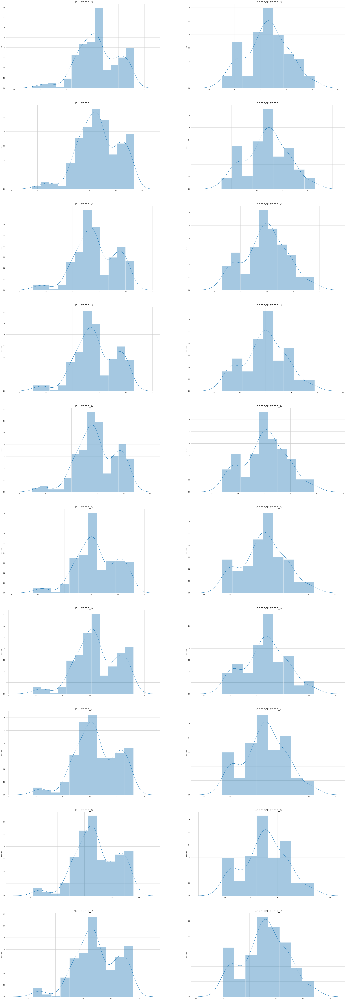

In [317]:
plot_temperature_distributions(val_hall, val_chamber)

3.3.4. HUMIDITY DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

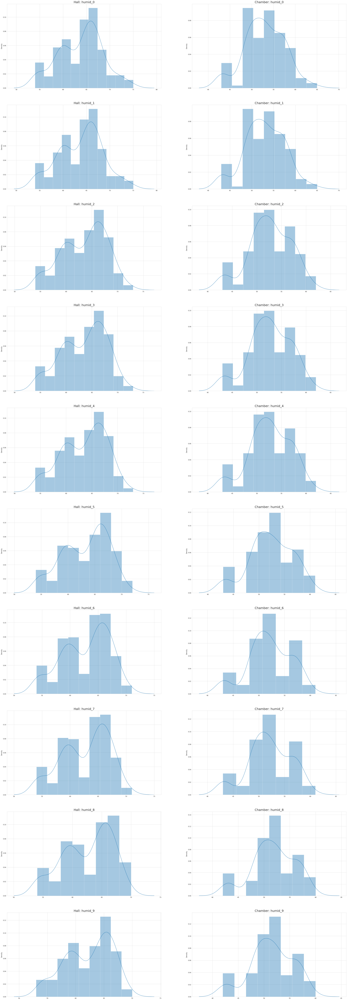

In [318]:
plot_humidity_distributions(val_hall, val_chamber)

3.3.5. GAS SCAN DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

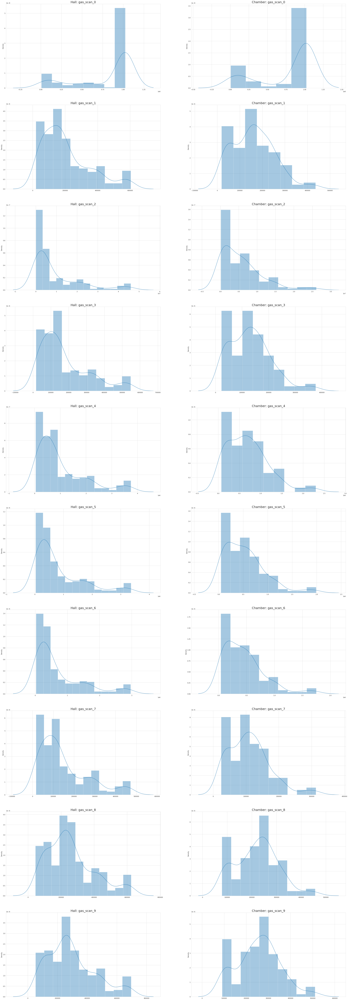

In [319]:
plot_gas_scan_distributions(val_hall, val_chamber)

# **3.4. TESTING DATA VENUE WISE ANALYSIS**


3.4.1. READ DATA

In [320]:
test_hall = test[test['venue']=='hall']
test_chamber = test[test['venue']=='chamber']

In [321]:
test_hall

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,146,2021-09-01 09:01:36.817528009+00:00,18.8,19.0,19.6,19.6,19.7,20.0,20.1,20.1,20.3,20.4,74,74,72,72,72,71,70,70,69,69,102400000,198100,7285000,168200,855800,692100,613100,150400,300900,364900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,146,2021-09-01 09:02:13.375891+00:00,19.2,19.3,19.8,19.8,19.9,20.2,20.2,20.2,20.4,20.5,69,69,69,69,69,69,68,68,68,68,102400000,293900,13181000,254800,1375800,1115100,971500,216100,358000,416900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,146,2021-09-01 09:02:50.057426+00:00,19.3,19.4,19.9,19.9,20.0,20.3,20.3,20.3,20.5,20.5,68,68,68,68,68,68,68,68,67,67,102400000,329300,15918300,286200,1618300,1293700,1126200,241500,392200,440300,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,146,2021-09-01 09:03:26.565743+00:00,19.3,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,68,68,68,68,68,68,68,67,67,67,102400000,350300,17541700,300900,1726800,1395500,1204700,254200,408900,453400,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,146,2021-09-01 09:04:03.635421991+00:00,19.4,19.5,20.0,20.0,20.1,20.4,20.4,20.4,20.6,20.6,68,68,68,68,68,68,67,67,67,67,102400000,343900,17305500,296200,1697800,1378600,1195200,252000,408200,456800,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488,140,2021-09-06 14:21:45.183520078+00:00,22.0,22.1,22.8,22.8,22.9,23.2,23.2,23.2,23.4,23.5,64,64,64,64,64,64,64,64,64,64,72076896,139700,2044900,97900,363700,144100,88600,42100,71200,75200,1,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
489,140,2021-09-06 14:22:21.810084104+00:00,22.4,22.5,23.0,23.0,23.1,23.3,23.4,23.4,23.6,23.6,64,64,64,64,64,64,64,64,64,64,18229700,73200,914200,62000,220000,109900,75900,36800,78000,85800,2,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
490,140,2021-09-06 14:22:58.646815+00:00,22.5,22.6,23.1,23.1,23.2,23.4,23.5,23.5,23.7,23.7,64,64,64,64,64,64,64,64,64,64,23557100,82900,1137400,70300,258500,131000,89800,41400,86500,97200,3,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall
491,140,2021-09-06 14:23:35.241487026+00:00,22.5,22.7,23.1,23.2,23.3,23.5,23.5,23.5,23.7,23.8,64,64,64,64,64,64,64,64,64,64,29276700,94100,1358000,78300,295400,150900,105100,45900,97100,106600,4,1,manual,Scott Pine branches in fire bowl,NaN,2021-09-06 16:30:22+00:00,2021-09-06 10:58:09+00:00,open fire,9,30m,2021-09-06 09:04:03+00:00,hall


In [322]:
test_chamber

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
255,146,2021-09-02 12:44:52.952491998+00:00,22.7,22.8,23.5,23.5,23.6,23.9,23.9,23.9,24.1,24.2,63,63,61,61,61,60,59,59,59,58,102400000,157300,4619100,133000,631900,501400,434400,117900,251600,306300,1,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
256,146,2021-09-02 12:45:29.686660051+00:00,23.0,23.1,23.7,23.7,23.8,24.0,24.1,24.1,24.3,24.3,59,59,59,59,59,58,58,58,58,57,102400000,238300,8260100,198700,1024000,787200,665700,163400,300900,342500,2,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
257,146,2021-09-02 12:46:06.169836044+00:00,23.1,23.2,23.8,23.8,23.9,24.1,24.1,24.1,24.3,24.4,58,58,58,58,58,58,58,57,57,57,102400000,265900,9810700,221800,1164600,904500,752500,179700,319500,360300,3,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
258,146,2021-09-02 12:46:42.852008104+00:00,23.1,23.3,23.8,23.8,23.9,24.2,24.2,24.2,24.4,24.4,58,58,58,58,58,58,57,57,57,57,102400000,279700,10694500,233400,1239700,963900,805800,187200,330000,376800,4,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
259,146,2021-09-02 12:47:19.891541957+00:00,23.2,23.3,23.8,23.9,23.9,24.2,24.2,24.2,24.4,24.5,58,58,58,58,58,57,57,57,57,57,102400000,270600,10409100,227300,1218600,947900,796400,185000,329600,383200,5,1,manual,SP2,0.1,2021-09-02 13:26:17+00:00,2021-09-02 11:44:12+00:00,320,7,4m,2021-09-02 09:50:49+00:00,chamber
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,140,2021-09-09 14:01:33.398730039+00:00,25.6,25.7,26.2,26.3,26.4,26.6,26.7,26.6,26.9,26.9,53,53,53,53,53,53,53,53,53,53,102400000,385600,16916800,339800,1901100,1480300,1217500,259800,355000,401700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
647,140,2021-09-09 14:02:10.090806961+00:00,25.7,25.9,26.3,26.4,26.4,26.7,26.7,26.7,26.9,27.0,53,53,53,53,53,53,53,53,53,53,102400000,377500,16557800,335800,1877600,1473900,1229600,261800,360600,414100,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
648,140,2021-09-09 14:02:46.800478935+00:00,25.8,25.9,26.4,26.4,26.5,26.7,26.8,26.8,27.0,27.0,53,53,53,53,53,53,53,53,53,53,102400000,388600,17374300,346000,1972500,1569000,1287600,270800,378700,427600,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
649,140,2021-09-09 14:03:23.476608991+00:00,25.8,25.9,26.4,26.5,26.6,26.8,26.8,26.8,27.0,27.1,53,53,53,53,53,53,53,53,53,53,102400000,402400,18476400,357600,2040300,1640600,1356700,280300,392400,439200,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


3.4.2. CORRELATION

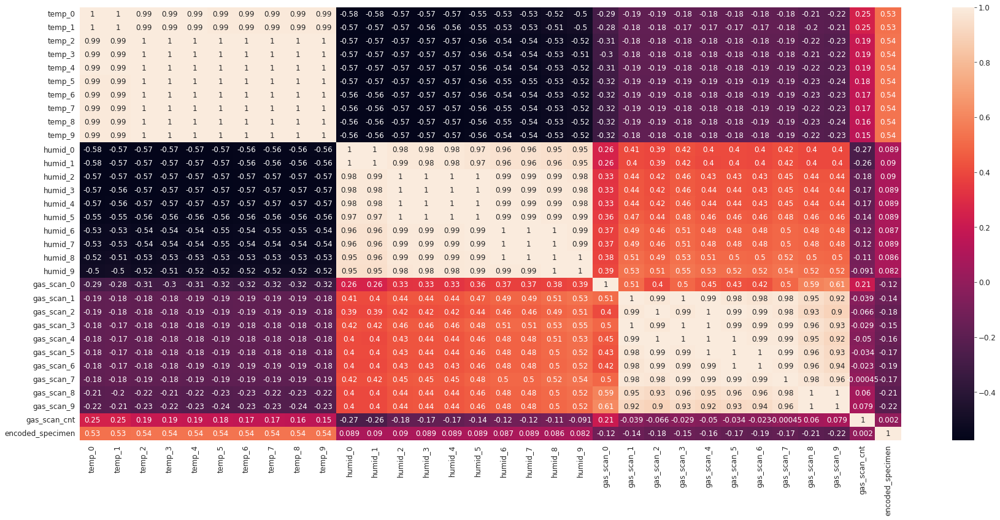

In [323]:
plt.figure(figsize=(30,13))
sns.heatmap(test_hall[columns_included].corr(), annot=True)

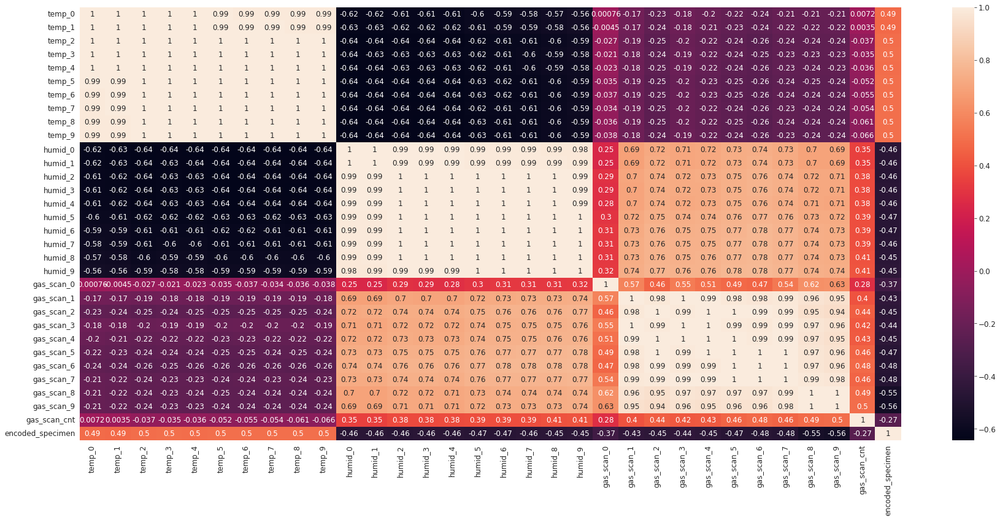

In [324]:
plt.figure(figsize=(30,13))
sns.heatmap(test_chamber[columns_included].corr(), annot=True)

3.4.3. TEMPERATURE DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

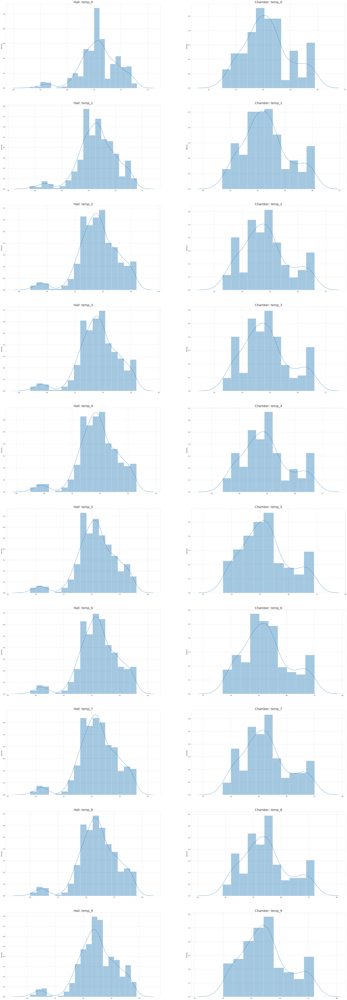

In [325]:
plot_temperature_distributions(test_hall, test_chamber)

3.4.4. HUMIDITY DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

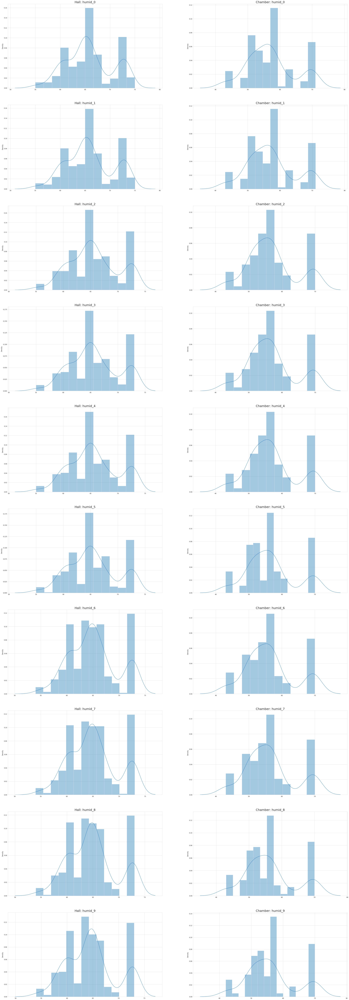

In [326]:
plot_humidity_distributions(test_hall, test_chamber)

3.4.5. GAS SCAN DISTRIBUTIONS

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

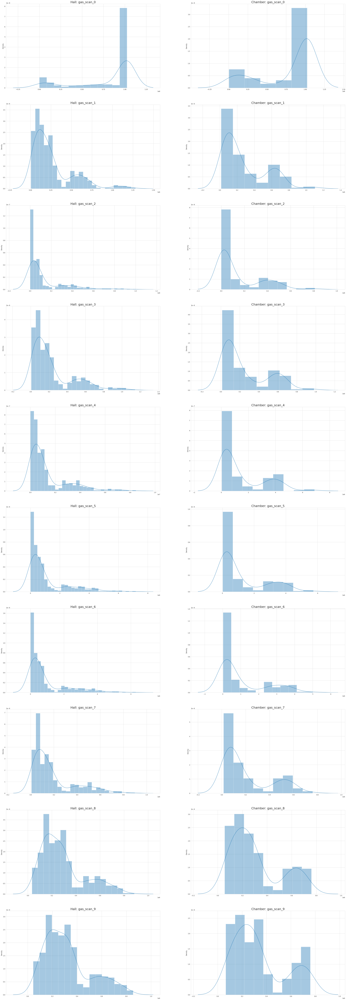

In [327]:
plot_gas_scan_distributions(test_hall, test_chamber)

# **4. INSIGHTS**

*  244 train data rows have no burn_material_amount, 103 validation data rows have no burn_material_amount, 81 test data rows have no burn_material_amount.
* All null values in burn_material_amount (g): from hall venue, with Scott Pine branches in fire bowl material, with manual trigger.
* Most of in_smoke class cases were predicted in hall environment.
* In train and test data, chamber environment shows almost balance distribution for in_smoke and clean_air class.